# Import packages

In [1]:
import pandas as pd
import numpy as np

import plotly
import plotly.graph_objects as go
import matplotlib.pyplot as plt

import sklearn
from funct import dfOverView_toDf

from math import pi

# Load data

In [2]:
data = pd.read_csv("Generation and customer dataset.csv", index_col = 0)

In [3]:
data.head()

,McDonalds,Hovis,Barcalys,Intu,LF Dogsthorpe,LF Alderby,LF Aveley Ph2,WIND Export Jacks Lane,WIND Export Wryde Croft,LF Newton Longville,...,LF Standgate,LF Wapseys Wood II,LF Sutton Courtney,SOLAR Swindon,LF Deep Moor,WIND Carnaby,LF Barnsdale,WIND Lilbourne 2,WIND Withernwick,WIND Lilbourne 3
2012-12-01 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
2012-12-01 00:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
2012-12-01 01:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
2012-12-01 01:30:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0
2012-12-01 02:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0


In [4]:
customers = ["McDonalds","Hovis","Barcalys","Intu"]
gen_dict = {
    "landfill": ["LF Dogsthorpe","LF Alderby","LF Aveley Ph2","LF Newton Longville","LF Bradgate 1", "LF Enderby Warren", "LF Dorket Head", "LF Leadenham", "LF Bradgate 2","LF Sandy Lane 1", "LF Sandy Lane 2", "LF Allerton Park", "LF Bennett Bank","LF Standgate", "LF Wapseys Wood II", "LF Sutton Courtney","LF Deep Moor","LF Barnsdale"],
    "wind": ["WIND Export Jacks Lane","WIND Export Wryde Croft","WIND Lilbourne 1","WIND Hyndburn","WIND Carnaby","WIND Lilbourne 2", "WIND Withernwick", "WIND Lilbourne 3"],
    "solar": ["SOLAR Swindon"]
}

In [5]:
solar_df = data[gen_dict['solar']]
headers = gen_dict['solar']
header = headers[0]

In [6]:
solar_df = solar_df.dropna()

In [7]:
print(headers)
print(header)

['SOLAR Swindon']
SOLAR Swindon


In [8]:
fig = go.Figure()

fig.add_trace(go.Scatter(
                x=solar_df[header].index,
                y=solar_df[header],
                name=header,
                opacity=0.8))
    
fig.update_layout(title_text='Solar generation output: ' + header)
fig.show()

In [11]:
year_from = 2017
year_to = 2020
n_years = year_to - year_from

In [12]:
n_years

3

In [23]:
train = solar_df.loc[str(year_from):str(year_to)]
# Train year 2017-2018
train_seasonal = solar_df.loc[str(year_from):str(year_from + 1)]
train.index = pd.to_datetime(train.index, format='%Y-%m-%d %H:%M:%S')
train_seasonal.index = pd.to_datetime(train_seasonal.index, format='%Y-%m-%d %H:%M:%S')

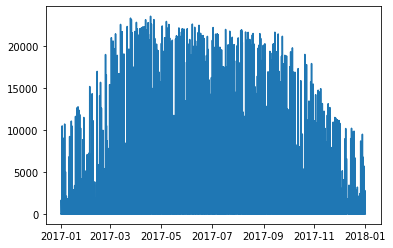

In [24]:
plt.plot(train_seasonal)

In [25]:
seasonal_curve = train_seasonal.resample('D').max().rolling(window=30, center=True).mean().dropna().T.values[0]

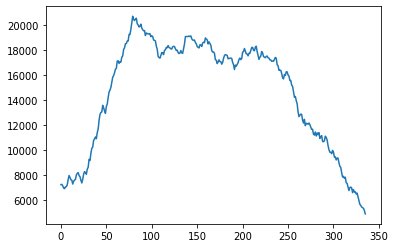

In [26]:
plt.plot(seasonal_curve)

In [27]:
seasonal_curve.min()

4897.503333333332

In [28]:
days = 365
t = np.linspace(0,pi,days)
#plt.plot(seasonal_curve.max()*np.sin(t))
seasonal = seasonal_curve.max()*np.sin(t)

In [29]:
for i in range(0,len(seasonal)):
    if seasonal[i] < seasonal_curve.min():
        seasonal[i] = int(seasonal_curve.min())

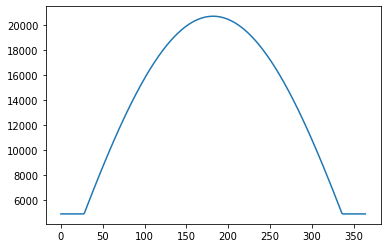

In [30]:
plt.plot(seasonal)

In [31]:
len(seasonal.tolist()*n_years)

1095

In [32]:
seasonal = np.array(seasonal.tolist()*n_years)

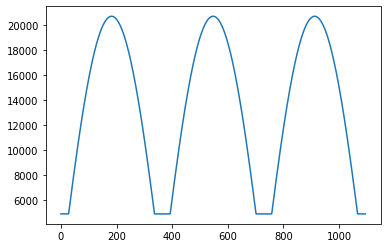

In [33]:
plt.plot(seasonal)

In [35]:
total_length = len(train)

In [53]:
# Define decay rate
decay_rate = 0.01*n_years
decay = 1 - np.linspace(0,decay_rate,total_length)

In [37]:
division = 20
zeros = np.zeros(int(total_length))
k = 0
for i in range(0,len(zeros)-24,48):
    #print(i)
    t = np.linspace(0,pi,division)
    zeros[i+24-int(division/2):i+24+int(division/2)] = seasonal[k]*np.sin(t)
    #print(i)
    #print(k)
    k = k+1

In [39]:
np.linspace(0,decay_rate,total_length)

array([0.00000000e+00, 5.70787115e-07, 1.14157423e-06, ...,
       2.99988584e-02, 2.99994292e-02, 3.00000000e-02])

In [40]:
decay

array([1.        , 0.99999943, 0.99999886, ..., 0.97000114, 0.97000057,
       0.97      ])

In [42]:
import colorednoise as cn
beta = 0.9 # the exponent
#samples = 2**18 # number of samples to generate
red_noise = cn.powerlaw_psd_gaussian(beta, total_length)

In [43]:
help(cn)

Help on module colorednoise:

NAME
    colorednoise - Generate colored noise.

FUNCTIONS
    normal(...) method of numpy.random.mtrand.RandomState instance
        normal(loc=0.0, scale=1.0, size=None)
        
        Draw random samples from a normal (Gaussian) distribution.
        
        The probability density function of the normal distribution, first
        derived by De Moivre and 200 years later by both Gauss and Laplace
        independently [2]_, is often called the bell curve because of
        its characteristic shape (see the example below).
        
        The normal distributions occurs often in nature.  For example, it
        describes the commonly occurring distribution of samples influenced
        by a large number of tiny, random disturbances, each with its own
        unique distribution [2]_.
        
        .. note::
            New code should use the ``normal`` method of a ``default_rng()``
            instance instead; see `random-quick-start`.
        

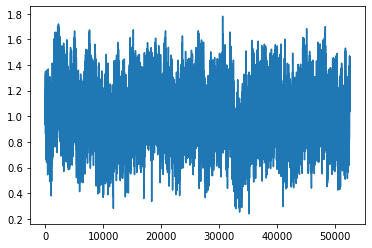

In [44]:
plt.plot(1 + red_noise*0.2)

In [45]:
#for i in range(0,len(zeros)):
 #   zeros[i] = zeros[i] + np.random.normal(0,np.sqrt(seasonal_curve.min()/2))
#for i in range(0,len(zeros)):
 #   zeros[i] = zeros[i]*np.random.normal(1,0.2)*decay[i]

In [46]:
# Add red noise
zeros = zeros*(1 + red_noise*0.2)

In [47]:
# Add decay
for i in range(0,len(zeros)):
    zeros[i] = zeros[i]*decay[i]

In [48]:
zeros.shape

(52560,)

In [49]:
simulated_df = pd.DataFrame(zeros, index = solar_df.loc["2017":"2020"].index , columns = ['Simulation'])

In [50]:
train

,SOLAR Swindon
2017-01-01 00:00:00,0.0
2017-01-01 00:30:00,0.0
2017-01-01 01:00:00,0.0
2017-01-01 01:30:00,0.0
2017-01-01 02:00:00,0.0
...,...
2019-12-31 21:30:00,0.0
2019-12-31 22:00:00,0.0
2019-12-31 22:30:00,0.0
2019-12-31 23:00:00,0.0


In [51]:
np.random.normal(0,np.sqrt(seasonal_curve.max()/2))

-56.00877223163674

In [52]:
fig = go.Figure()

fig.add_trace(go.Scatter(
                x=simulated_df['Simulation'].index,
                y=simulated_df['Simulation'],
                name='Simulated',
                opacity=0.8))
fig.add_trace(go.Scatter(
                x=solar_df.loc["2017":"2020"].index,
                y=solar_df.loc["2017":"2020"][header],
                name='Actual',
                opacity=0.8))
fig.show()

In [39]:
simulated_df

,Simulation
2017-01-01 00:00:00,0.0
2017-01-01 00:30:00,0.0
2017-01-01 01:00:00,0.0
2017-01-01 01:30:00,0.0
2017-01-01 02:00:00,0.0
...,...
2019-12-31 21:30:00,0.0
2019-12-31 22:00:00,0.0
2019-12-31 22:30:00,0.0
2019-12-31 23:00:00,0.0


### Get data actual

In [40]:
location = 'C:/Users/jose_/Google Drive/PhD/Renewables/Renewables paper/Plot data/Total/'
title = 'Solar '
#print(traces_df.iloc[dates_list[t+1]].name[:10])
#one_period = traces_df.iloc[dates_list[t]:dates_list[t+1]]


pd.DataFrame(simulated_df['Simulation'].values).to_csv(location + title + 'simulated.dat', header=None, index=None)
pd.DataFrame(train.values).to_csv(location + title + 'real.dat', header=None, index=None)

### Get data daily avg

In [41]:
simulated_df.index = pd.to_datetime(simulated_df.index, format='%Y-%m-%d %H:%M:%S')
simulated_df_daily = simulated_df.resample('D').mean()
train_daily = train.resample('D').mean()

In [42]:
location = 'C:/Users/jose_/Google Drive/PhD/Renewables/Renewables paper/Plot data/Total/'
title = 'Daily solar '
#print(traces_df.iloc[dates_list[t+1]].name[:10])
#one_period = traces_df.iloc[dates_list[t]:dates_list[t+1]]


pd.DataFrame(simulated_df_daily['Simulation'].values).to_csv(location + title + 'simulated.dat', header=None, index=None)
pd.DataFrame(train_daily.values).to_csv(location + title + 'real.dat', header=None, index=None)

In [43]:
fig = go.Figure()

fig.add_trace(go.Scatter(
                x=simulated_df_daily['Simulation'].index,
                y=simulated_df_daily['Simulation'],
                name='Simulated',
                opacity=0.8))
fig.add_trace(go.Scatter(
                x=train_daily[header].index,
                y=train_daily[header],
                name='Actual',
                opacity=0.8))
fig.show()

In [44]:
simulated_df.loc[str(year_from)]

,Simulation
2017-01-01 00:00:00,0.0
2017-01-01 00:30:00,0.0
2017-01-01 01:00:00,0.0
2017-01-01 01:30:00,0.0
2017-01-01 02:00:00,0.0
...,...
2017-12-31 21:30:00,0.0
2017-12-31 22:00:00,0.0
2017-12-31 22:30:00,0.0
2017-12-31 23:00:00,0.0


In [45]:
train.loc[str(year_from)]

,SOLAR Swindon
2017-01-01 00:00:00,0.0
2017-01-01 00:30:00,0.0
2017-01-01 01:00:00,0.0
2017-01-01 01:30:00,0.0
2017-01-01 02:00:00,0.0
...,...
2017-12-31 21:30:00,0.0
2017-12-31 22:00:00,0.0
2017-12-31 22:30:00,0.0
2017-12-31 23:00:00,0.0


In [46]:
train.loc[str(year_from)].values.sum()/1000, simulated_df.loc[str(year_from)].values.sum()/1000

(58776.606, 59845.68558852342)

In [47]:
train.loc[str(year_from+1)].values.sum()/1000, simulated_df.loc[str(year_from+1)].values.sum()/1000

(62362.27264, 59788.513111212225)

In [48]:
train.loc[str(year_from+2)].values.sum()/1000, simulated_df.loc[str(year_from+2)].values.sum()/1000

(58424.65609999999, 59955.106048883674)

In [395]:
train.values.sum()/1000

58776.606

In [396]:
zeros.sum()/1000

58024.63334652785